In [1]:
import pandas as pd
import pickle
import plotly.express as px
import plotly.graph_objs as go

In [2]:
def roc_dfs_from_file_subgroups(file_subgroups):
    """
    Returns a dataframe of the roc data from the given pickle files with an additional
    label for the given subgroup.

    file_subgroups : List of Size=2 Tuples (String file_name, String subgroup)

    Example Input: [("roc_A.pkl", "Asian"), ("roc_B.pkl", "Black")]
    """
    roc_df = pd.DataFrame()
    for tup in file_subgroups:
        f_name = tup[0]
        group = tup[1]
        temp_df = roc_df_from_pkl(f_name, group)
        roc_df = pd.concat([roc_df, temp_df])
    return roc_df


In [3]:
def plot_roc_from_pkl(file_name, subgroup):
    """
    Given the pickle file name and the corresponding subgroup, returns a roc plot.

    Example Input: "roc_A.pkl", "Asian"
    """
    return (plot_roc_from_df(roc_df_from_pkl(file_name, subgroup)))


In [4]:
def plot_roc_from_df(roc_df):
    """
    Plots the roc curve colored by subgroup from the given dataframe, which must contain fpr, tpr, and subgroup columns
    """

    roc_plot = px.line(roc_df,
                       labels=dict(x="fpr", y="tpr", color="Subgroup"),
                       x=roc_df['fpr'],
                       y=roc_df['tpr'],
                       color=roc_df['subgroup'],
                       title="Receiver Operating Characteristic (ROC) curve")

    return roc_plot


In [5]:
def roc_df_from_pkl(file_name, subgroup):
    """
    Given the pickle file name and the corresponding subgroup, returns a dataframe of the loaded data with an
    additional column for the given subgroup.

    Example Input: "roc_A.pkl", "Asian"
    """
    infile = open(file_name, 'rb')
    new_dict = pickle.load(infile)
    infile.close()
    roc_df = pd.DataFrame(new_dict)

    had_to_flip = False
    # Issue due to non-standardized pickle format
    if (roc_df.shape[0] == 3):
        roc_df = roc_df.transpose()
        had_to_flip = True

    roc_df.columns = ['fpr', 'tpr', 'threshold']
    # Issue due to non-standardized pickle format
    # if (roc_df.iloc[0]['tpr'] < .01):
    #     roc_df['tpr'] = 1 - roc_df['tpr']
    #
    # roc_df = roc_df.drop(0)

    roc_df['subgroup'] = subgroup
    return roc_df


In [6]:
def format_roc_curve(roc_curve):

    roc_curve.add_trace(
    go.Scatter(
        x=[0, 1.5],
        y=[0, 1.5],
        mode="lines",
        line=go.scatter.Line(color="gray"),
        showlegend=False)
)
    roc_curve['layout'].update(width=750, height=500, autosize=False)
    roc_curve['layout']['yaxis'].update(range=[0, 1.05])
    roc_curve['layout']['xaxis'].update(range=[0, 1.])


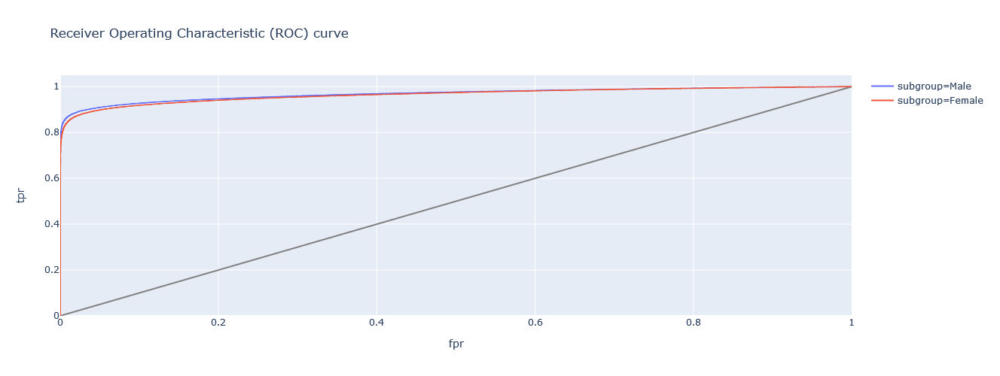

In [7]:
roc_df = roc_dfs_from_file_subgroups([("roc_data_M.pkl", "Male"),
                                      ("roc_data_F.pkl","Female")])
roc_sex = plot_roc_from_df(roc_df)
format_roc_curve(roc_sex)
roc_sex.show()

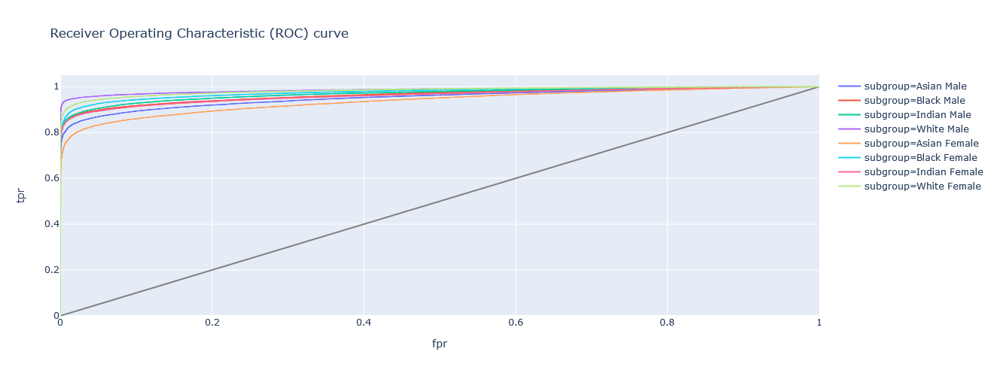

In [8]:
roc_df = roc_dfs_from_file_subgroups([("roc_data_AM.pkl", "Asian Male"),
                                      ("roc_data_BM.pkl","Black Male"),
                                      ("roc_data_IM.pkl","Indian Male"),
                                      ("roc_data_WM.pkl","White Male"),
                                      ("roc_data_AF.pkl","Asian Female"),
                                      ("roc_data_BF.pkl","Black Female"),
                                      ("roc_data_IF.pkl","Indian Female"),
                                      ("roc_data_WF.pkl","White Female")])

roc_all = plot_roc_from_df(roc_df)
format_roc_curve(roc_all)
roc_all.show()